# <font color='red'> Identifying similar neighborhood clusters  </font>

## <font color='blue'> Loading the required libraries</font>

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import plotly.express as px
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import silhouette_samples, silhouette_score
from sklearn.cluster import KMeans
import requests
import json
#import pyarrow as pa
#from pyarrow import csv
from functools import reduce
from sklearn.decomposition import PCA
from sklearn.cluster import DBSCAN
from sklearn.manifold import TSNE
import pandas_bokeh
import matplotlib.pyplot as plt
import pgeocode
import geopandas as gpd
from shapely.geometry import Point
from geopandas import GeoDataFrame
import plotly.graph_objects as go
import collections
import warnings
warnings.filterwarnings("ignore")

## <font color='blue'> Loading housing and census data</font>

#### <font color='magenta'> 1) Loading Zillow data set with zip code level census data</font>

In [2]:
# loading Zillow data
temp_zillow_df = pd.read_csv('assets/master_v4.csv')

#### <font color='magenta'> 2) Cleaning data set and descriptive statistics </font>

In [3]:
# Get all the column names used to pivot the data 
column_names = temp_zillow_df.columns

column_names_ids = ['RegionID', 'SizeRank', 'zipcode', 'RegionType', 'StateName', 'State', 'City', 'Metro', 'CountyName',\
                    'B01001_001E', 'B01001_002E', 'B01001_026E', 'B01002_001E', 'B01002_002E', 'B01002_003E', 'B08012_002E', \
                    'B08012_003E', 'B08012_004E', 'B08012_005E', 'B08012_006E', 'B08012_007E', 'B08012_008E', 'B08012_009E',\
                    'B08012_010E', 'B08012_011E', 'B08012_012E', 'B08012_013E', 'B17026_002E', 'B17026_003E', 'B17026_004E',\
                    'B17026_005E', 'B17026_006E', 'B17026_007E', 'B17026_008E', 'B17026_009E', 'B17026_010E', 'B17026_011E',\
                    'B17026_012E', 'B17026_013E', 'year', 'house_occupied_ratio','house_vacant_ratio',\
                    'has_one_or_more_computing_device_ratio', 'has_no_computing_device_ratio','has_health_insurance_ratio',\
                    'has_health_insurance_ratio_26_to_64','has_health_insurance_ratio_65_and_over',\
                    'household_no_vehicles_ratio','household_1_vehicle_ratio', 'household_2_vehicles_ratio', \
                    'household_3_vehicles_ratio','household_4_vehicles_ratio_or_more','housing_units_with_mortgage_ratio',\
                    'housing_units_no_mortgage_ratio','owner_occupied_ratio','renter_occupied_ratio',\
                    'has_internet_ratio','has_no_internet_ratio','male_25_old_and_over_has_associate_or_higher_ratio',\
                    'female_25_old_and_over_has_associate_or_higher_ratio', 'median_monthly_housing_costs',\
                    'median_household_income','median_household_income_with_mortgage','median_household_income_with_no_mortgage',\
                    'median_year_structure_built']

column_names_values = list(set(column_names).difference(column_names_ids))

# Melt the dataframe 
zillow_df = temp_zillow_df.melt(id_vars=column_names_ids,
                                var_name='date',
                                value_vars=column_names_values,
                                value_name='sale_price')

In [4]:
# Create additional columns to the zillow dataframe
zillow_df['year_to_filter'] = zillow_df['date'].apply(lambda x: str(x).split('-',1)[0])
zillow_df['year'] = zillow_df['year'].astype('str')
zillow_df['year_to_filter'] = zillow_df['year_to_filter'].astype('str', errors = 'ignore')

In [5]:
zillow_df.head(1)

,RegionID,SizeRank,zipcode,RegionType,StateName,State,City,Metro,CountyName,B01001_001E,...,male_25_old_and_over_has_associate_or_higher_ratio,female_25_old_and_over_has_associate_or_higher_ratio,median_monthly_housing_costs,median_household_income,median_household_income_with_mortgage,median_household_income_with_no_mortgage,median_year_structure_built,date,sale_price,year_to_filter
0,91982,1,77494,zip,TX,TX,Katy,"Houston-The Woodlands-Sugar Land, TX",Fort Bend County,129165,...,0.764861,0.696519,2251,157996,164858,126976,2010,B08201_006E,2171.0,B08201_006E


In [6]:
# Given the data was pivotted from a wide format to long format, only keep rows where year matches the year of the data
zillow_df = zillow_df[zillow_df['year'] == zillow_df['year_to_filter']]

# Remove rows where sale price is null
zillow_df = zillow_df[zillow_df['sale_price'].notna()]

# len(zillow_df) = 1,455,441

In [7]:
enriched_housing_df = zillow_df.copy()

# Create temp columns to extract data from based on two time-periods
yr = max(enriched_housing_df['date']).split('-')[0]
month = max(enriched_housing_df['date']).split('-')[1]
day = max(enriched_housing_df['date']).split('-')[2]
previous_yr = str(int(yr) - 1) + '-' + month + '-' + day

# Only keep data from the last month (which is 2021-12-31 and would be used to train models) and 
# data from a year back (which is 2020-12-31 and would be used for validation)

enriched_housing_df = enriched_housing_df[(enriched_housing_df['date']==max(enriched_housing_df['date'])) | \
                                           (enriched_housing_df['date']==previous_yr)]

## <font color='blue'> Feature engineering </font>

In [8]:
# Population size
enriched_housing_df['total_population'] = enriched_housing_df['B01001_001E']

# Percentage of Male and Female
enriched_housing_df['gender_pct_male'] = enriched_housing_df['B01001_002E'] / enriched_housing_df['B01001_001E']
enriched_housing_df['gender_pct_female'] = enriched_housing_df['B01001_026E'] / enriched_housing_df['B01001_001E']

# Median age of population directly pulling from the data set
enriched_housing_df['age_total'] = enriched_housing_df['B01002_001E']
enriched_housing_df['age_male'] = enriched_housing_df['B01002_002E']
enriched_housing_df['age_female'] = enriched_housing_df['B01002_003E']



In [9]:
# Find mean of ages to replace when the age is less than zero
age_total_mean = enriched_housing_df[enriched_housing_df['age_total']>0]['age_total'].mean()
enriched_housing_df['age_total'] = enriched_housing_df['age_total'].apply(lambda x: age_total_mean if x<0 else x)

age_male_mean = enriched_housing_df[enriched_housing_df['age_male']>0]['age_male'].mean()
enriched_housing_df['age_male'] = enriched_housing_df['age_male'].apply(lambda x: age_male_mean if x<0 else x)

age_female_mean = enriched_housing_df[enriched_housing_df['age_female']>0]['age_female'].mean()
enriched_housing_df['age_female'] = enriched_housing_df['age_female'].apply(lambda x: age_female_mean if x<0 else x)

In [10]:
# travel to work
enriched_housing_df['travel_to_work'] = enriched_housing_df['B08012_002E'] + enriched_housing_df['B08012_003E'] + enriched_housing_df['B08012_004E'] +\
                                enriched_housing_df['B08012_005E'] + enriched_housing_df['B08012_006E'] + enriched_housing_df['B08012_007E'] +\
                                enriched_housing_df['B08012_008E'] + enriched_housing_df['B08012_009E'] + enriched_housing_df['B08012_010E'] +\
                                enriched_housing_df['B08012_011E'] + enriched_housing_df['B08012_012E'] + enriched_housing_df['B08012_013E']

enriched_housing_df['travel_to_work_less_than_5mins'] = enriched_housing_df['B08012_002E'] / enriched_housing_df['travel_to_work']
enriched_housing_df['travel_to_work_less_than_5_9mins'] = enriched_housing_df['B08012_003E'] / enriched_housing_df['travel_to_work']
enriched_housing_df['travel_to_work_less_than_10_14mins'] = enriched_housing_df['B08012_004E'] / enriched_housing_df['travel_to_work']
enriched_housing_df['travel_to_work_less_than_15_19mins'] = enriched_housing_df['B08012_005E'] / enriched_housing_df['travel_to_work']
enriched_housing_df['travel_to_work_less_than_20_24mins'] = enriched_housing_df['B08012_006E'] / enriched_housing_df['travel_to_work']
enriched_housing_df['travel_to_work_less_than_25_29mins'] = enriched_housing_df['B08012_007E'] / enriched_housing_df['travel_to_work']
enriched_housing_df['travel_to_work_less_than_30_34mins'] = enriched_housing_df['B08012_008E'] / enriched_housing_df['travel_to_work']
enriched_housing_df['travel_to_work_less_than_35_39mins'] = enriched_housing_df['B08012_009E'] / enriched_housing_df['travel_to_work']
enriched_housing_df['travel_to_work_less_than_40_44mins'] = enriched_housing_df['B08012_010E'] / enriched_housing_df['travel_to_work']
enriched_housing_df['travel_to_work_less_than_45_59mins'] = enriched_housing_df['B08012_011E'] / enriched_housing_df['travel_to_work']
enriched_housing_df['travel_to_work_less_than_60_89mins'] = enriched_housing_df['B08012_012E'] / enriched_housing_df['travel_to_work']
enriched_housing_df['travel_to_work_more_than_90mins'] = enriched_housing_df['B08012_013E'] / enriched_housing_df['travel_to_work']

In [11]:
# Ratio of Income to Poverty level

enriched_housing_df['income_to_poverty_ratio'] = enriched_housing_df['B17026_002E'] + enriched_housing_df['B17026_003E'] + \
                                                    enriched_housing_df['B17026_004E'] + enriched_housing_df['B17026_005E'] + \
                                                    enriched_housing_df['B17026_006E'] + enriched_housing_df['B17026_007E'] + \
                                                    enriched_housing_df['B17026_008E'] + enriched_housing_df['B17026_009E'] + \
                                                    enriched_housing_df['B17026_010E'] + enriched_housing_df['B17026_011E'] + \
                                                    enriched_housing_df['B17026_012E'] + enriched_housing_df['B17026_013E']

enriched_housing_df['income_to_poverty_under_0.5'] = enriched_housing_df['B17026_002E'] / enriched_housing_df['income_to_poverty_ratio']
enriched_housing_df['income_to_poverty_0.5_to_0.74'] = enriched_housing_df['B17026_003E'] / enriched_housing_df['income_to_poverty_ratio']
enriched_housing_df['income_to_poverty_0.75_to_0.99'] = enriched_housing_df['B17026_004E'] / enriched_housing_df['income_to_poverty_ratio']
enriched_housing_df['income_to_poverty_1.0_to_1.24'] = enriched_housing_df['B17026_005E'] / enriched_housing_df['income_to_poverty_ratio']
enriched_housing_df['income_to_poverty_1.25_to_1.49'] = enriched_housing_df['B17026_006E'] / enriched_housing_df['income_to_poverty_ratio']
enriched_housing_df['income_to_poverty_1.50_to_1.74'] = enriched_housing_df['B17026_007E'] / enriched_housing_df['income_to_poverty_ratio']
enriched_housing_df['income_to_poverty_1.75_to_1.84'] = enriched_housing_df['B17026_008E'] / enriched_housing_df['income_to_poverty_ratio']
enriched_housing_df['income_to_poverty_1.85_to_1.99'] = enriched_housing_df['B17026_009E'] / enriched_housing_df['income_to_poverty_ratio']
enriched_housing_df['income_to_poverty_2.00_to_2.99'] = enriched_housing_df['B17026_010E'] / enriched_housing_df['income_to_poverty_ratio']
enriched_housing_df['income_to_poverty_3.00_to_3.99'] = enriched_housing_df['B17026_011E'] / enriched_housing_df['income_to_poverty_ratio']
enriched_housing_df['income_to_poverty_4.00_to_4.99'] = enriched_housing_df['B17026_012E'] / enriched_housing_df['income_to_poverty_ratio']
enriched_housing_df['income_to_poverty_5.00_and_over'] = enriched_housing_df['B17026_013E'] / enriched_housing_df['income_to_poverty_ratio']

enriched_housing_df['income_to_poverty_2.00_and_under'] = (enriched_housing_df['B17026_002E'] + enriched_housing_df['B17026_003E'] + \
                                                           enriched_housing_df['B17026_004E'] + enriched_housing_df['B17026_005E'] + \
                                                           enriched_housing_df['B17026_006E'] + enriched_housing_df['B17026_007E'] + \
                                                           enriched_housing_df['B17026_008E'] + enriched_housing_df['B17026_009E'] + 
                                                           enriched_housing_df['B17026_010E']) / enriched_housing_df['income_to_poverty_ratio']


In [12]:
# Columns to keep. Don't keep the raw columns from census but only the feature engineered ones
census_columns_to_include = ['sale_price','total_population','gender_pct_male','gender_pct_female','age_total','age_male','age_female',\
                              'travel_to_work_less_than_5mins','travel_to_work_less_than_5_9mins','travel_to_work_less_than_10_14mins',\
                              'travel_to_work_less_than_15_19mins','travel_to_work_less_than_20_24mins','travel_to_work_less_than_25_29mins', \
                              'travel_to_work_less_than_30_34mins','travel_to_work_less_than_35_39mins','travel_to_work_less_than_40_44mins', \
                              'travel_to_work_less_than_45_59mins','travel_to_work_less_than_60_89mins','travel_to_work_more_than_90mins', \
                              'income_to_poverty_under_0.5', 'income_to_poverty_0.5_to_0.74','income_to_poverty_0.75_to_0.99', \
                              'income_to_poverty_1.0_to_1.24','income_to_poverty_1.25_to_1.49','income_to_poverty_1.50_to_1.74', \
                              'income_to_poverty_1.75_to_1.84','income_to_poverty_1.85_to_1.99','income_to_poverty_2.00_to_2.99', \
                              'income_to_poverty_3.00_to_3.99','income_to_poverty_4.00_to_4.99','income_to_poverty_5.00_and_over', \
                              'income_to_poverty_2.00_and_under',\
                                'has_one_or_more_computing_device_ratio', 'has_no_computing_device_ratio','has_health_insurance_ratio',\
                                'has_health_insurance_ratio_26_to_64','has_health_insurance_ratio_65_and_over',\
                                'household_no_vehicles_ratio','household_1_vehicle_ratio', 'household_2_vehicles_ratio', \
                                'household_3_vehicles_ratio','household_4_vehicles_ratio_or_more','housing_units_with_mortgage_ratio',\
                                'housing_units_no_mortgage_ratio','owner_occupied_ratio','renter_occupied_ratio',\
                                'has_internet_ratio','has_no_internet_ratio','male_25_old_and_over_has_associate_or_higher_ratio',\
                                'female_25_old_and_over_has_associate_or_higher_ratio',\
                                'median_monthly_housing_costs','median_household_income','median_household_income_with_mortgage','median_household_income_with_no_mortgage',\
                                'median_year_structure_built','zipcode','year','date']

In [13]:
# The final data set that will be used for clustering 

# Only keep data from the most recent date
filtered_zillow_df = enriched_housing_df[enriched_housing_df['date']==max(enriched_housing_df['date'])][census_columns_to_include]

# calculate the mean of each column
mean = filtered_zillow_df.mean()

# fill NaN values with the mean of each column
filtered_zillow_df.fillna(mean, inplace=True)

# Create log of sale price since this data can be skewed 
filtered_zillow_df['sale_price_log'] = np.log(filtered_zillow_df['sale_price'])

filtered_zillow_df.head(5)

,sale_price,total_population,gender_pct_male,gender_pct_female,age_total,age_male,age_female,travel_to_work_less_than_5mins,travel_to_work_less_than_5_9mins,travel_to_work_less_than_10_14mins,...,female_25_old_and_over_has_associate_or_higher_ratio,median_monthly_housing_costs,median_household_income,median_household_income_with_mortgage,median_household_income_with_no_mortgage,median_year_structure_built,zipcode,year,date,sale_price_log
4587555,423914.215432,129165,0.487230,0.512770,36.9,37.3,36.6,0.013306,0.052593,0.071138,...,0.696519,2251,157996,164858,126976,2010,77494,2021,2021-12-31,12.957286
4587560,539475.064434,130352,0.502401,0.497599,18.4,17.5,19.3,0.027456,0.158053,0.230378,...,0.325226,1532,73421,93032,52774,1991,8701,2021,2021-12-31,13.198352
4587565,247528.181318,119994,0.487274,0.512726,33.2,31.2,34.4,0.008649,0.050910,0.078791,...,0.373327,1471,87733,94969,70418,2003,77449,2021,2021-12-31,12.419280
4587570,867940.311424,116469,0.530940,0.469060,34.3,34.0,34.6,0.012297,0.019087,0.043754,...,0.233512,1764,75590,87599,66742,1961,11368,2021,2021-12-31,13.673878
4587575,241630.991048,107864,0.473995,0.526005,33.2,33.4,32.7,0.015663,0.057634,0.076037,...,0.371567,1297,87318,92917,70685,1992,77084,2021,2021-12-31,12.395167


In [14]:
# The validation data set that will be used to validate the clustering results

# We are essentially using data from Dec 2021 to build clusters and using data from Dec 2020 to validate the clusters 

yr = max(enriched_housing_df['date']).split('-')[0]
month = max(enriched_housing_df['date']).split('-')[1]
day = max(enriched_housing_df['date']).split('-')[2]
previous_yr = str(int(yr) - 1) + '-' + month + '-' + day

# for the validation data set we will use data from Dec 2020
test_zillow_df = enriched_housing_df[enriched_housing_df['date'].str.contains(previous_yr)][census_columns_to_include]
test_mean = test_zillow_df.mean()
test_zillow_df.fillna(test_mean, inplace=True)
test_zillow_df['sale_price_log'] = np.log(test_zillow_df['sale_price'])

# <font color='blue'> Data exploration and Correlation Plots </font></font>

#### <font color='magenta'> 1) Distribution of sale price for the last available date </font></font>

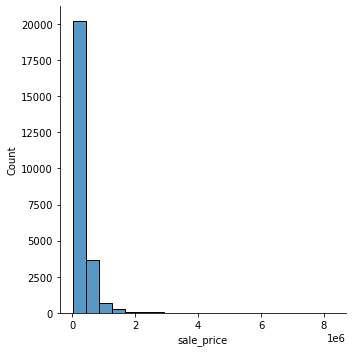

In [15]:
# Plotting the distribution of the sale price and it is right skewed
sns.displot(filtered_zillow_df, x="sale_price", bins=20)

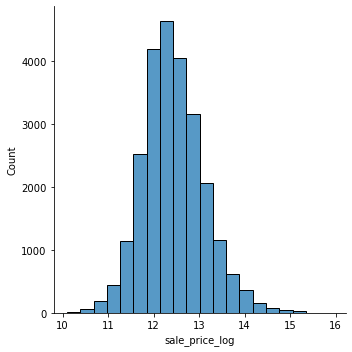

In [16]:
# Plotting the distribution of log of sale price and it is normal and it has treated the outliers
sns.displot(filtered_zillow_df, x="sale_price_log", bins=20)

#### <font color='magenta'> 2. with all fetaures </font>

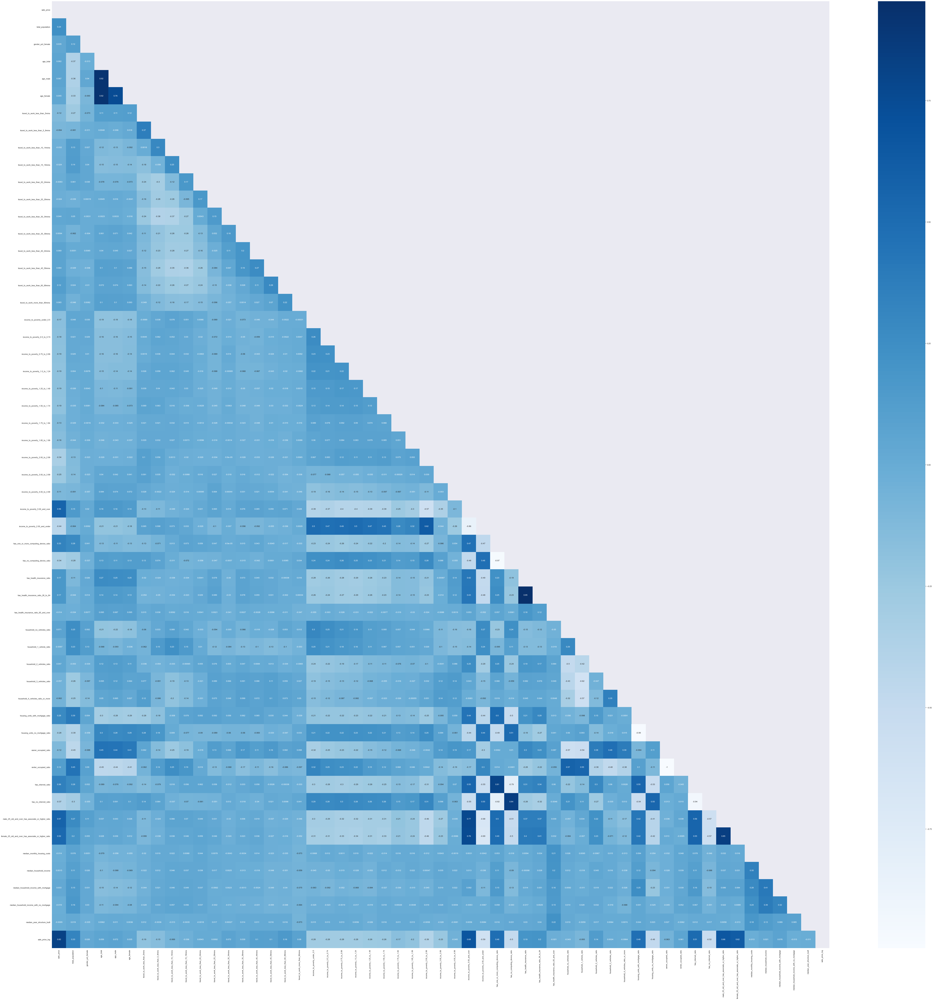

In [17]:
# dropping the features for which we don't want to include in the correlation plot
corr_with_all_features_df = filtered_zillow_df.drop(['zipcode','year','gender_pct_male'],axis=1)

corr_with_all_features_df['sale_price_log'] = np.log(corr_with_all_features_df['sale_price'])

sns.set(rc={'figure.figsize':(100, 100)})
sns.heatmap(corr_with_all_features_df.corr(), mask=np.triu(corr_with_all_features_df.corr()), annot=True, cmap="Blues"); 

#### <font color='magenta'> 3. With fetaures correlated with sale price </font>

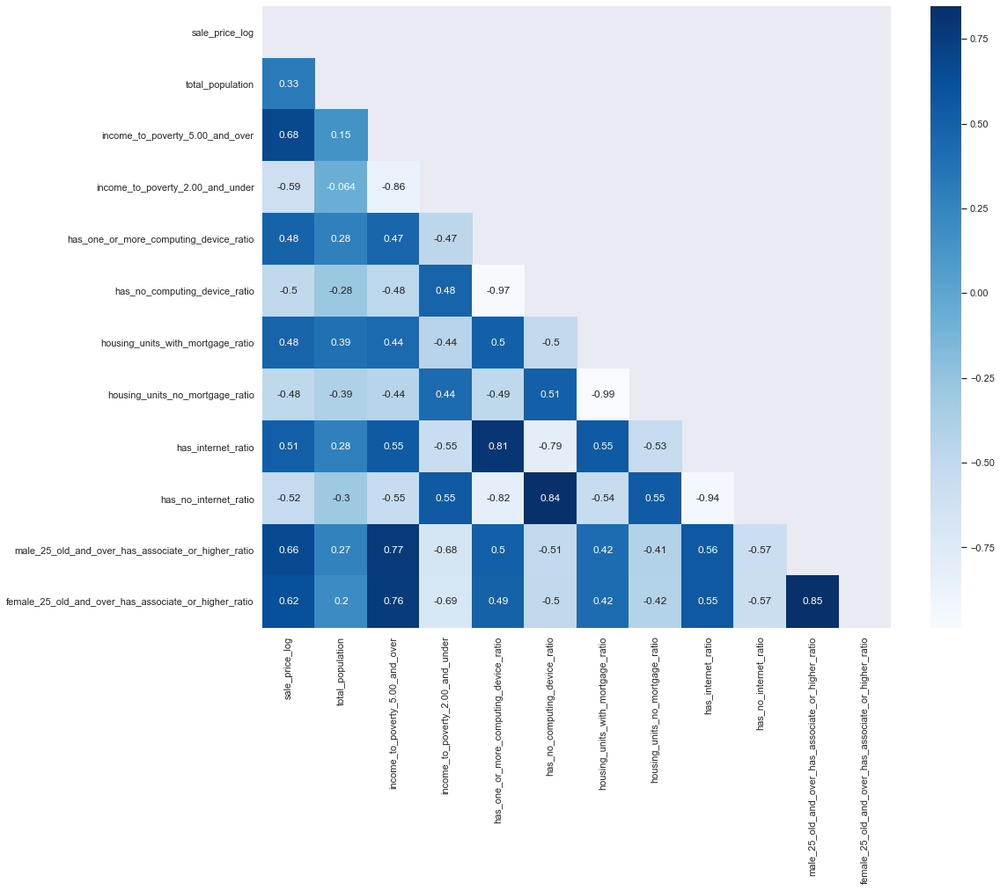

In [18]:
# Given we have a lot of features just pulling the top features with correlation and plotting the heatmap with just these features
important_features = ['sale_price_log','total_population',\
                     'income_to_poverty_5.00_and_over', 'income_to_poverty_2.00_and_under', \
                     'has_one_or_more_computing_device_ratio', 'has_no_computing_device_ratio', \
                     'housing_units_with_mortgage_ratio', 'housing_units_no_mortgage_ratio', \
                     'has_internet_ratio', 'has_no_internet_ratio',\
                     'male_25_old_and_over_has_associate_or_higher_ratio', 'female_25_old_and_over_has_associate_or_higher_ratio']

corr_important_features_df = filtered_zillow_df[important_features]
sns.set(rc={'figure.figsize':(16,13)})
sns.heatmap(corr_important_features_df.corr(), annot=True, mask=np.triu(corr_important_features_df.corr()), cmap="Blues");

#### <font color='magenta'> 4. Exploration of feature distribution </font>

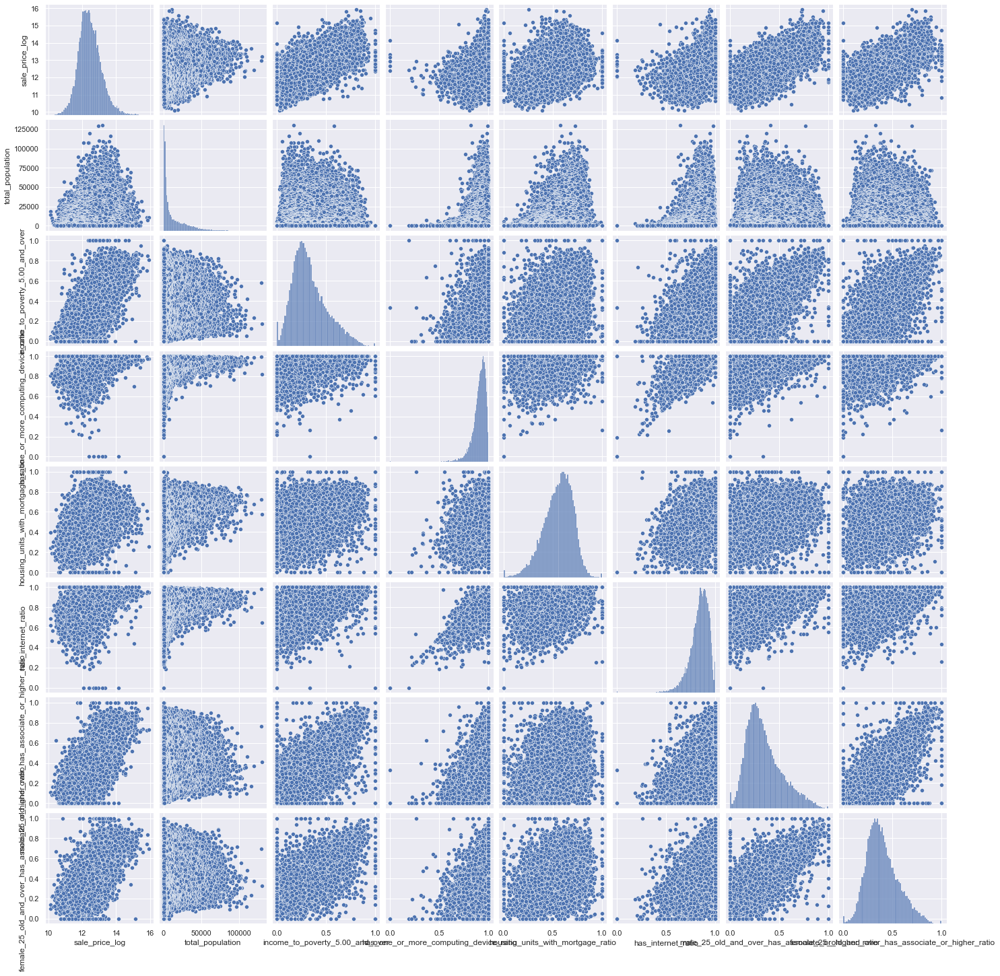

In [19]:
#scatterplot of the subset of important features to understand how various features interact with each other

subset_important_features = ['sale_price_log','total_population', 'income_to_poverty_5.00_and_over',\
                             'has_one_or_more_computing_device_ratio', 'housing_units_with_mortgage_ratio', 'has_internet_ratio',\
                             'male_25_old_and_over_has_associate_or_higher_ratio', 'female_25_old_and_over_has_associate_or_higher_ratio']
sns.set()
sns.pairplot(filtered_zillow_df[subset_important_features], size = 2.5)
plt.show();

In [20]:
# Plot the heatmap of sale_price with high income rate field
fig = px.density_heatmap(filtered_zillow_df[filtered_zillow_df['sale_price']<700000], \
                         marginal_x='histogram', marginal_y='histogram',\
                         x="sale_price", y="income_to_poverty_5.00_and_over", color_continuous_scale=px.colors.sequential.Blues)
fig.show(renderer="colab")

In [21]:
# Plot the heatmap of sale_price with low income rate field

fig = px.density_heatmap(filtered_zillow_df[filtered_zillow_df['sale_price']<700000], \
                         marginal_x='histogram', marginal_y='histogram',\
                         x="sale_price", y="income_to_poverty_2.00_and_under", color_continuous_scale=px.colors.sequential.Blues)
fig.show(renderer="colab")

# <font color='blue'> Unsupervised learning </font>

### <font color='blue'> K-means </font>

In [22]:
# Copy of Zillow data set
#filtered_zillow_df = pd.read_csv('zillow_censum_combined_data.csv')
kmeans_clustering_df = filtered_zillow_df.copy()

In [23]:
len(kmeans_clustering_df.columns)

59

#### <font color='magenta'> 1) With all features scaled</font>

In [24]:
# Created a scaled data set prior to running the k-means algorithm. 
# Having a scaled data set is important since k-means uses distance measures to form the clusters

scaler = MinMaxScaler()
kmeans_scaled = kmeans_clustering_df.copy()

cols_to_scale = kmeans_clustering_df.columns[(kmeans_clustering_df.columns != 'zipcode') & (kmeans_clustering_df.columns != 'date')]
kmeans_scaled[cols_to_scale] = scaler.fit_transform(kmeans_clustering_df[cols_to_scale])
kmeans_scaled_clustering_df = pd.DataFrame(kmeans_scaled, columns=kmeans_clustering_df.drop(columns=['year','date','sale_price']).columns)

<AxesSubplot:>

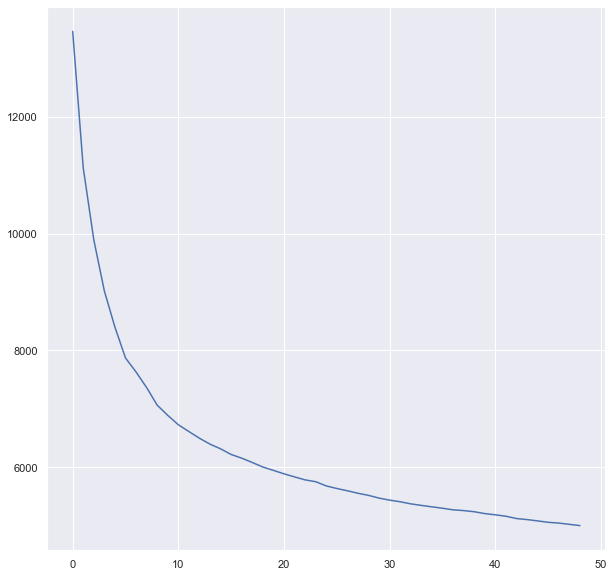

In [25]:
# use the elbow method to identify the approximate right number of clusters
score = []
for i in range(1, 50):
    kmeans = KMeans(n_clusters = i, init = 'k-means++', max_iter = 300, n_init = 10, random_state = 0)
    kmeans.fit(kmeans_scaled_clustering_df.drop(columns=['zipcode']))
    score.append(kmeans.inertia_)
sns.set(rc={'figure.figsize':(10, 10)})
sns.lineplot(data=score)

In [26]:
# for varying clusters numbers find the silhouette coefficient to identify the best # of clusters

for i in list([4, 5, 10]):
    kmeans = KMeans(n_clusters=i,random_state=0)
    kmeans.fit(kmeans_scaled_clustering_df.drop(columns=['zipcode']))
    labels_clusters_10 = kmeans.labels_
    score = silhouette_score(kmeans_scaled_clustering_df.drop(columns=['zipcode']), labels_clusters_10)
    print("Silhouette Coefficient:", score)

Silhouette Coefficient: 0.17082556044625996
Silhouette Coefficient: 0.18121873161864152
Silhouette Coefficient: 0.10479003281524513


In [27]:
# when number of clusters is 5 is when the silhouette co-efficient was the highest

kmeans = KMeans(n_clusters=5,random_state=0)
kmeans.fit(kmeans_scaled_clustering_df.drop(columns=['zipcode']))
labels_clusters_count = collections.Counter(kmeans.labels_)

# Print the size of the cluster 
for key, value in labels_clusters_count.items():
    print("For Cluster %s, the number of items are %s" % (key, value))

For Cluster 1, the number of items are 7445
For Cluster 2, the number of items are 4360
For Cluster 3, the number of items are 11363
For Cluster 4, the number of items are 860
For Cluster 0, the number of items are 936


#### <font color='magenta'> 2) Using correlated features after scaling</font>

In [28]:
# Instead of using the entire data set find just the features correlated with sale price

correlated_features_with_zipcode=[]
correlated_features_with_zipcode = important_features.copy()
correlated_features_with_zipcode.append('zipcode')

In [29]:
# for varying clusters numbers find the silhouette coefficient to identify the best # of clusters

for i in list([4, 5, 10]):
    kmeans = KMeans(n_clusters=i,random_state=0)
    kmeans.fit(kmeans_scaled_clustering_df[correlated_features_with_zipcode].drop(columns=['zipcode']))
    labels_clusters = kmeans.labels_
    score = silhouette_score(kmeans_scaled_clustering_df[correlated_features_with_zipcode].drop(columns=['zipcode']), labels_clusters)
    print("Silhouette Coefficient:", score)

Silhouette Coefficient: 0.19674084105615036
Silhouette Coefficient: 0.18769101649489553
Silhouette Coefficient: 0.1475854503378027


In [30]:
# We use the cluster of size 5 given that it has good silhouette coefficient (similar to the cluster of size 4) and makes sense to split 

kmeans = KMeans(n_clusters=5,random_state=0)
kmeans.fit(kmeans_scaled_clustering_df[correlated_features_with_zipcode].drop(columns=['zipcode']))
kmeans_corr_scaled_dataset = kmeans_scaled_clustering_df[correlated_features_with_zipcode].copy()
kmeans_corr_scaled_dataset.loc[:,'Cluster'] = kmeans.labels_

In [31]:
# Merge the data with cluster information with the initial data set to get combined data set for analysis

correlated_features_with_zipcode.append('sale_price')
temp_results_corr_df = kmeans_clustering_df[correlated_features_with_zipcode].copy()
kmeans_clustering_results_corr_df = pd.merge(temp_results_corr_df, kmeans_corr_scaled_dataset[['zipcode','Cluster']], \
                                                        on=['zipcode'], how='left')

#### <font color='green'> Results from K-means clustering with reduced just correlated features </font>

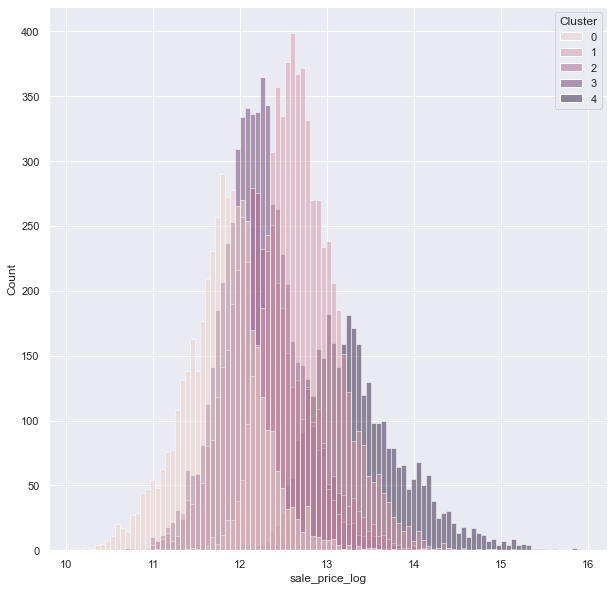

In [32]:
# Plot the distribution of log of sale price by cluster 

sns.histplot(data = kmeans_clustering_results_corr_df[['sale_price_log', 'Cluster']], x='sale_price_log', hue="Cluster")
sns.set(rc={'figure.figsize':(6, 6)})
plt.show();

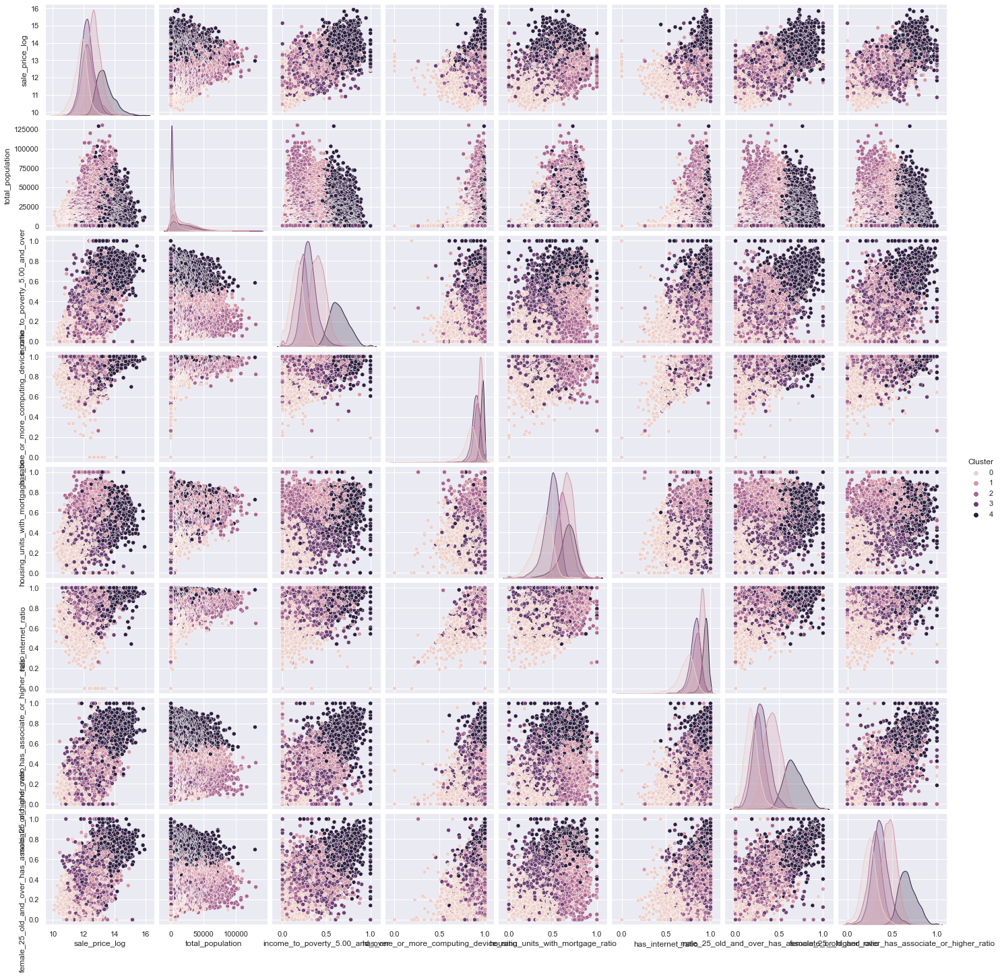

In [33]:
# Plot the scatter plot of important features by giving hue as cluster labels to see if differnt clusters are capturing the 
# differences in these features

subset_important_features_with_labels = []
subset_important_features_with_labels = subset_important_features.copy()
subset_important_features_with_labels.append('Cluster')
sns.pairplot(kmeans_clustering_results_corr_df[subset_important_features_with_labels], hue="Cluster")
plt.show();

In [34]:
# Plot the avg. sale price by cluster labels

results_corr_df = kmeans_clustering_results_corr_df.groupby(by=['Cluster']).mean().reset_index()
fig = px.bar(results_corr_df, y="sale_price", x='Cluster', color="Cluster")
fig.show(renderer="colab")

In [35]:
# Measure the size of each cluster

kmeans_clustering_results_corr_df.groupby(by=['Cluster']).size()

Cluster
0    4672
1    6152
2    4697
3    5968
4    3475
dtype: int64

In [36]:
# To understand the relation between sales price and high income to poverty rate by cluster

kmeans_clustering_results_corr_df['Cluster'] = kmeans_clustering_results_corr_df['Cluster'] .astype('str')
fig = px.scatter(kmeans_clustering_results_corr_df[kmeans_clustering_results_corr_df['sale_price']<700000],\
                 x="sale_price", y="income_to_poverty_5.00_and_over", color="Cluster", log_x=True, size_max=50)
fig.show(renderer="colab")

In [37]:
# To understand the relation between sales price and housing units without mortgage by cluster

kmeans_clustering_results_corr_df['Cluster'] = kmeans_clustering_results_corr_df['Cluster'] .astype('str')
fig = px.scatter(kmeans_clustering_results_corr_df[kmeans_clustering_results_corr_df['sale_price']<700000],\
                 x="sale_price", y="housing_units_no_mortgage_ratio", color="Cluster", log_x=True, size_max=50)
fig.show(renderer="colab")

In [38]:
pandas_bokeh.output_notebook()
nomi = pgeocode.Nominatim('us')

kmeans_corr_scaled_geo_df = kmeans_corr_scaled_dataset[['zipcode','Cluster']]
kmeans_corr_scaled_geo_df['zipcode'] = kmeans_corr_scaled_geo_df['zipcode'].astype('str')
kmeans_corr_scaled_geo_df['Latitude'] = list(nomi.query_postal_code(kmeans_corr_scaled_geo_df['zipcode'].tolist()).latitude)
kmeans_corr_scaled_geo_df['Longitude'] = list(nomi.query_postal_code(kmeans_corr_scaled_geo_df['zipcode'].tolist()).longitude)
kmeans_corr_scaled_geo_df.dropna(how='any', inplace=True)
fig = go.Figure(data=go.Scattergeo(
        lon = kmeans_corr_scaled_geo_df['Longitude'],
        lat = kmeans_corr_scaled_geo_df['Latitude'],
        text = kmeans_corr_scaled_geo_df['Cluster'],
        mode = 'markers',
        marker=dict(color=kmeans_corr_scaled_geo_df['Cluster'],
               colorscale='Jet',
               showscale=True)
        ))
fig.update_layout(
        title = 'Clusters',
        geo_scope='usa',
        dragmode=False
    )
fig.show(renderer="colab")

Loading BokehJS ...

In [39]:
# Copy of Zillow test data set

test_kmeans_clustering_df = test_zillow_df.copy()

# Created a scaled data set prior to running the k-means algorithm. 
# Having a scaled data set is important since k-means uses distance measures to form the clusters

test_kmeans_scaled = test_kmeans_clustering_df.copy()

cols_to_scale = test_kmeans_clustering_df.columns[(test_kmeans_clustering_df.columns != 'zipcode') & (test_kmeans_clustering_df.columns != 'date')]
test_kmeans_scaled[cols_to_scale] = scaler.fit_transform(test_kmeans_clustering_df[cols_to_scale])
test_kmeans_scaled_clustering_df = pd.DataFrame(test_kmeans_scaled, \
                                           columns=test_kmeans_clustering_df.drop(columns=['year','date','sale_price']).columns)

In [40]:
# We use the cluster of size 5 given that it has good silhouette coefficient (similar to the cluster of size 4) and makes sense to split 
correlated_features_with_zipcode.remove('sale_price')
test_kmeans = KMeans(n_clusters=5,random_state=0)
test_kmeans.fit(test_kmeans_scaled_clustering_df[correlated_features_with_zipcode].drop(columns=['zipcode']))

test_kmeans_corr_scaled_dataset = test_kmeans_scaled_clustering_df[correlated_features_with_zipcode].copy()
test_kmeans_corr_scaled_dataset.loc[:,'Cluster'] = test_kmeans.labels_

In [41]:
# Merge the data with cluster information with the initial data set to get combined data set for analysis

correlated_features_with_zipcode.append('sale_price')
test_kmeans_clustering_results_corr_df = pd.merge(test_kmeans_clustering_df[correlated_features_with_zipcode].copy(), \
                                                  test_kmeans_corr_scaled_dataset[['zipcode','Cluster']], \
                                                        on=['zipcode'], how='left')
test_results_corr_df = test_kmeans_clustering_results_corr_df.groupby(by=['Cluster']).mean().reset_index()
test_results_corr_df.head(5)

,Cluster,sale_price_log,total_population,income_to_poverty_5.00_and_over,income_to_poverty_2.00_and_under,has_one_or_more_computing_device_ratio,has_no_computing_device_ratio,housing_units_with_mortgage_ratio,housing_units_no_mortgage_ratio,has_internet_ratio,has_no_internet_ratio,male_25_old_and_over_has_associate_or_higher_ratio,female_25_old_and_over_has_associate_or_higher_ratio,zipcode,sale_price
0,0,12.174174,20509.643645,0.203869,0.529194,0.896711,0.103289,0.628538,0.371462,0.816254,0.154936,0.241030,0.296512,51439.491564,219067.094282
1,1,11.681327,5588.168788,0.159260,0.598487,0.805498,0.192939,0.382128,0.615862,0.694876,0.270460,0.177958,0.236749,48893.738558,131020.495426
2,2,13.213725,19724.718463,0.632697,0.169136,0.959924,0.040076,0.662930,0.337070,0.925398,0.054234,0.656149,0.658372,43552.855218,652465.060116
3,3,12.589737,17549.287429,0.402324,0.309438,0.935579,0.064421,0.662078,0.337759,0.883146,0.093033,0.408092,0.455604,46870.431955,321408.979786
4,4,12.082415,4448.447006,0.291623,0.401552,0.883809,0.116191,0.483367,0.516633,0.805956,0.165612,0.289174,0.355633,48874.101509,193771.941272


In [42]:
# Plot the avg. sale price by cluster labels

test_results_corr_df['Cluster'] = test_results_corr_df['Cluster'].astype('str')
fig = px.bar(test_results_corr_df, y="sale_price", x='Cluster', color="Cluster")
fig.show(renderer="colab")

In [43]:
# Measure the size of each cluster

test_kmeans_clustering_results_corr_df.groupby(by=['Cluster']).size()

Cluster
0    4445
1    4479
2    3488
3    6165
4    6029
dtype: int64

In [44]:
# To understand the relation between sales price and high income to poverty rate by cluster and to see if they are well seperated

test_kmeans_clustering_results_corr_df['Cluster'] = test_kmeans_clustering_results_corr_df['Cluster'] .astype('str')
fig = px.scatter(test_kmeans_clustering_results_corr_df[test_kmeans_clustering_results_corr_df['sale_price']<700000],\
                 x="sale_price", y="income_to_poverty_5.00_and_over", color="Cluster", log_x=True, size_max=50)
fig.show(renderer="colab")

#### <font color='magenta'> 3) With PCA components </font>

In [45]:
# creating the PCA components and check with multiple values of the components and cluster numbers to check which values give the best silhouette coefficient

pca_kmeans_df = pd.DataFrame(columns = ['n_components', 'num_of_clusters', 'silhouette_coefficient'])

for n_components in [3, 5, 7, 10]:
    pca = PCA(n_components=n_components) # create a PCA instance with components specified in the list
    principalComponents = pca.fit_transform(kmeans_scaled_clustering_df.drop(columns=['zipcode'])) 

    # load the pca components into a df
    PCA_components = pd.DataFrame(principalComponents)

    for i in list([4, 5, 6, 10]):

        kmeans = KMeans(n_clusters=i,random_state=0)
        kmeans.fit(PCA_components)
        labels_clusters_10 = kmeans.labels_

        score = silhouette_score(PCA_components, labels_clusters_10)
        
        pca_kmeans_df = pca_kmeans_df.append({'n_components' : n_components, 'silhouette_coefficient': round(score, 2), \
                                                    'num_of_clusters' : i}, ignore_index=True)

<AxesSubplot:xlabel='num_of_clusters', ylabel='n_components'>

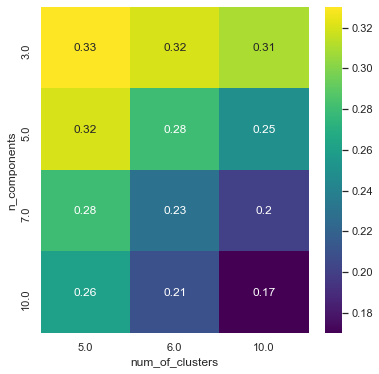

In [46]:
# Plot the Silhouette coefficient as a heatmpa for the varying cluster size and number of components
pca_kmeans_pivot_df = pca_kmeans_df[pca_kmeans_df['num_of_clusters']>4].pivot(index='n_components', columns='num_of_clusters', values='silhouette_coefficient')
sns.heatmap(pca_kmeans_pivot_df, annot=True, fmt="g", cmap='viridis')

In [47]:
# Store the index of the pca results dataframe which has the number of components and clusters that gave the best results
max_silhouette_coefficient = pca_kmeans_df[pca_kmeans_df['num_of_clusters']>4]['silhouette_coefficient'].idxmax()

# Store the best number of components and the best number of cluster
final_pca_component = int(pca_kmeans_df.iloc[max_silhouette_coefficient][0])
final_num_clusters = int(pca_kmeans_df.iloc[max_silhouette_coefficient][1])

In [48]:
# creating the PCA instance with the best number of components and clusters
pca = PCA(n_components=final_pca_component)
principalComponents = pca.fit_transform(kmeans_scaled_clustering_df.drop(columns=['zipcode']))

# load the pca components into a dataframe
PCA_components = pd.DataFrame(principalComponents)

kmeans = KMeans(n_clusters=final_num_clusters,random_state=0)
kmeans.fit(PCA_components)
labels_clusters_10 = kmeans.labels_

# Copy the PCA components results and the cluster labels
PCA_components_results = PCA_components.copy()
PCA_components_results['Cluster'] = labels_clusters_10

In [49]:
print('The explained variation per principal component is as follows : {}'.format(pca.explained_variance_ratio_))

The explained variation per principal component is as follows : [0.26498624 0.15427899 0.11089513]


In [50]:
# Let's look at the information captured by the principal components
fig = px.bar(y=pca.explained_variance_ratio_, x=['PCA_1','PCA_2','PCA_3'])
fig.show(renderer="colab")

<AxesSubplot:>

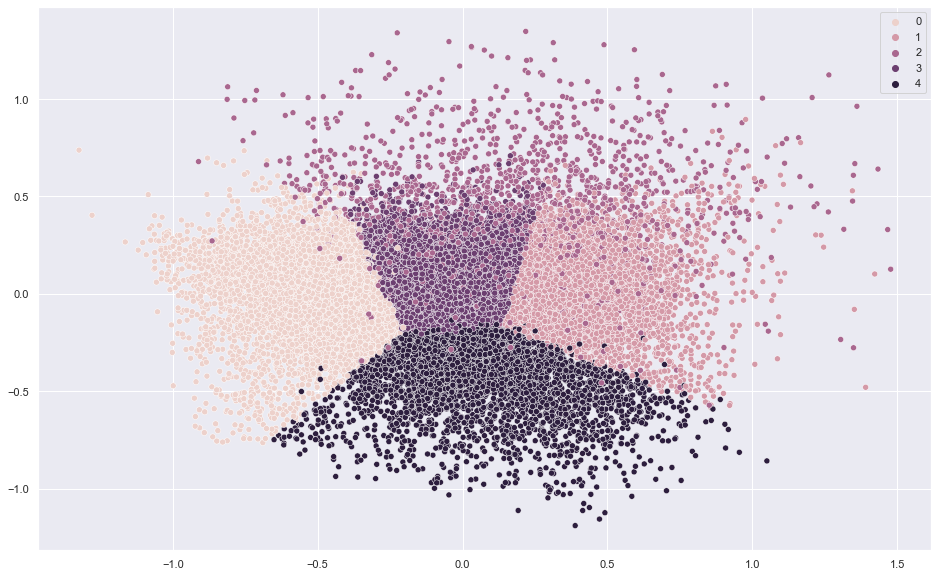

In [51]:
# Plot the first two PCA components  
plt.figure(figsize=(16,10))
sns.scatterplot(
    x = PCA_components[0].values, 
    y = PCA_components[1].values,
    hue=kmeans.labels_,
    legend="full"
)

#### <font color='green'> K-means - PCA - Results </font>

In [52]:
# Append the clusters identified via PCA with the original data set to explore the cluster validity

kmeans_scaled_pca_clustering_df = pd.concat([kmeans_clustering_df.reset_index(drop = True), PCA_components_results], axis=1)
kmeans_scaled_pca_clustering_df['Cluster'] = kmeans_scaled_pca_clustering_df['Cluster'].astype('str')

In [53]:
# Plot the average sale price by cluster 
# we want to get clusters that are decently seperated in the sale price

kmeans_sale_price_result = kmeans_scaled_pca_clustering_df[['sale_price','Cluster']].groupby(by=['Cluster']).mean().reset_index()
kmeans_sale_price_result.sale_price = kmeans_sale_price_result.sale_price.round()

fig = px.bar(kmeans_sale_price_result,\
             y="sale_price", x='Cluster', color="Cluster", text='sale_price')
fig.show(renderer="colab")

In [54]:
# Next step in monitoring the cluster quality for this business problem 
# we want to have clusters that are similar in size
kmeans_scaled_pca_clustering_df.groupby(by=['Cluster']).size()

Cluster
0    5211
1    6268
2    1469
3    8167
4    3849
dtype: int64

In [55]:
# To understand the relation between sales price and high income to poverty rate by cluster and to see if they are well seperated

color_discrete_map = {'0': 'rgb(99,110,250)', '1': 'rgb(238,85,60)', '2': 'rgb(3,204,150)', '3': 'rgb(171,98,250)', '4': 'rgb(254,161,89)'}

fig = px.scatter(kmeans_scaled_pca_clustering_df[kmeans_scaled_pca_clustering_df['sale_price']<700000],\
                 x="sale_price", y="income_to_poverty_5.00_and_over", color="Cluster", \
                 color_discrete_map=color_discrete_map,\
                 log_x=True, size_max=50)
fig.show(renderer="colab")



In [56]:
# To understand the relation between sales price and housing units without mortgage ratio by cluster and to see if they are well seperated

color_discrete_map = {'0': 'rgb(99,110,250)', '1': 'rgb(238,85,60)', '2': 'rgb(3,204,150)', '3': 'rgb(171,98,250)', '4': 'rgb(254,161,89)'}

fig = px.scatter(kmeans_scaled_pca_clustering_df[kmeans_scaled_pca_clustering_df['sale_price']<700000],color_discrete_map=color_discrete_map,\
                 x="sale_price", y="female_25_old_and_over_has_associate_or_higher_ratio", color="Cluster", log_x=True, size_max=50)
fig.show(renderer="colab")

In [57]:
pandas_bokeh.output_notebook()
nomi = pgeocode.Nominatim('us')

kmeans_scaled_pca_geo_df = kmeans_scaled_pca_clustering_df[['zipcode','Cluster']]
kmeans_scaled_pca_geo_df['zipcode'] = kmeans_scaled_pca_geo_df['zipcode'].astype('str')
kmeans_scaled_pca_geo_df['Cluster'] = kmeans_scaled_pca_geo_df['Cluster'].astype('int')
kmeans_scaled_pca_geo_df['Latitude'] = list(nomi.query_postal_code(kmeans_scaled_pca_geo_df['zipcode'].tolist()).latitude)
kmeans_scaled_pca_geo_df['Longitude'] = list(nomi.query_postal_code(kmeans_scaled_pca_geo_df['zipcode'].tolist()).longitude)
kmeans_scaled_pca_geo_df.dropna(how='any', inplace=True)
fig = go.Figure(data=go.Scattergeo(
        lon = kmeans_scaled_pca_geo_df['Longitude'],
        lat = kmeans_scaled_pca_geo_df['Latitude'],
        text = kmeans_scaled_pca_geo_df['Cluster'],
        mode = 'markers',
        marker=dict(color=kmeans_scaled_pca_geo_df['Cluster'],
               colorscale='Jet',
               showscale=True)
        ))
fig.update_layout(
        title = 'Clusters',
        geo_scope='usa',
        dragmode=False
    )
fig.show(renderer="colab")

Loading BokehJS ...

#### <font color='magenta'> Validating the results of k-means PCA data set</font>

In [58]:
# Copy of Zillow test data set

test_kmeans_clustering_df = test_zillow_df.copy()

# Created a scaled data set prior to running the k-means algorithm. 
# Having a scaled data set is important since k-means uses distance measures to form the clusters

test_kmeans_scaled = test_kmeans_clustering_df.copy()

cols_to_scale = test_kmeans_clustering_df.columns[(test_kmeans_clustering_df.columns != 'zipcode') & (test_kmeans_clustering_df.columns != 'date')]
test_kmeans_scaled[cols_to_scale] = scaler.fit_transform(test_kmeans_clustering_df[cols_to_scale])
test_kmeans_scaled_clustering_df = pd.DataFrame(test_kmeans_scaled, \
                                           columns=test_kmeans_clustering_df.drop(columns=['year','date','sale_price']).columns)

In [59]:
# creating the PCA instance with the best number of components and clusters
pca = PCA(n_components=final_pca_component)
validate_principalComponents = pca.fit_transform(test_kmeans_scaled_clustering_df.drop(columns=['zipcode']))

# load the pca components into a dataframe
validate_PCA_components = pd.DataFrame(validate_principalComponents)

kmeans = KMeans(n_clusters=final_num_clusters,random_state=0)
kmeans.fit(validate_PCA_components)
validate_labels_clusters = kmeans.labels_

# Copy the PCA components results and the cluster labels
validate_PCA_components_results = validate_PCA_components.copy()
validate_PCA_components_results['Cluster'] = validate_labels_clusters

score = silhouette_score(validate_PCA_components, validate_labels_clusters)

print("Silhouette Coefficient", score)

Silhouette Coefficient 0.32644301361439004


In [60]:
# Append the clusters identified via PCA with the original data set to explore the cluster validity

validate_kmeans_scaled_pca_clustering_df = pd.concat([test_kmeans_clustering_df.reset_index(drop = True), validate_PCA_components_results], axis=1)
validate_kmeans_scaled_pca_clustering_df['Cluster'] = validate_kmeans_scaled_pca_clustering_df['Cluster'].astype('str')

In [61]:
# Next step in monitoring the cluster quality for this business problem 
# we want to have clusters that are similar in size
validate_kmeans_scaled_pca_clustering_df.groupby(by=['Cluster']).size()

Cluster
0    3784
1    8061
2    6284
3    1382
4    5095
dtype: int64

In [62]:
# Plot the average sale price by cluster 
# we want to get clusters that are decently seperated in the sale price
color_discrete_map = {'0': 'rgb(99,110,250)', '1': 'rgb(238,85,60)', '2': 'rgb(3,204,150)', '3': 'rgb(171,98,250)', '4': 'rgb(254,161,89)'}

validate_kmeans_sale_price_result = validate_kmeans_scaled_pca_clustering_df[['sale_price','Cluster']].groupby(by=['Cluster']).mean().reset_index()
validate_kmeans_sale_price_result.sale_price = validate_kmeans_sale_price_result.sale_price.round()

fig = px.bar(validate_kmeans_sale_price_result[['sale_price','Cluster']].groupby(by=['Cluster']).mean().reset_index(),\
             y="sale_price", x='Cluster', color="Cluster", color_discrete_map=color_discrete_map, text='sale_price')
fig.show(renderer="colab")

In [63]:
color_discrete_map = {'0': 'rgb(99,110,250)', '1': 'rgb(238,85,60)', '2': 'rgb(3,204,150)', '3': 'rgb(171,98,250)', '4': 'rgb(254,161,89)'}

fig = px.scatter(validate_kmeans_scaled_pca_clustering_df[validate_kmeans_scaled_pca_clustering_df['sale_price']<700000],\
                 x="sale_price", y="income_to_poverty_5.00_and_over", color="Cluster", \
                 color_discrete_map=color_discrete_map,\
                 log_x=True, size_max=50)
fig.show(renderer="colab")

#### <font color='magenta'> 4) With t-SNE components </font>

In [64]:
# Using another dimensionality reduction technique t-SNE to see if we are able to improve the Silhouette coefficient 

tsne = TSNE(n_components=2, verbose=1, perplexity=40, n_iter=300)
tsne_results = tsne.fit_transform(kmeans_scaled_clustering_df.drop(columns=['zipcode']))

# Use the cluster number from the above approaches 
kmeans = KMeans(n_clusters=5,random_state=0)
kmeans.fit(tsne_results)
tsne_cluster_labels = kmeans.labels_
score = silhouette_score(kmeans_scaled_clustering_df.drop(columns=['zipcode']), tsne_cluster_labels)
print("Silhouette Coefficient:", score)

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 24964 samples in 0.122s...
[t-SNE] Computed neighbors for 24964 samples in 94.096s...
[t-SNE] Computed conditional probabilities for sample 1000 / 24964
[t-SNE] Computed conditional probabilities for sample 2000 / 24964
[t-SNE] Computed conditional probabilities for sample 3000 / 24964
[t-SNE] Computed conditional probabilities for sample 4000 / 24964
[t-SNE] Computed conditional probabilities for sample 5000 / 24964
[t-SNE] Computed conditional probabilities for sample 6000 / 24964
[t-SNE] Computed conditional probabilities for sample 7000 / 24964
[t-SNE] Computed conditional probabilities for sample 8000 / 24964
[t-SNE] Computed conditional probabilities for sample 9000 / 24964
[t-SNE] Computed conditional probabilities for sample 10000 / 24964
[t-SNE] Computed conditional probabilities for sample 11000 / 24964
[t-SNE] Computed conditional probabilities for sample 12000 / 24964
[t-SNE] Computed conditional probabilities for s

### <font color='blue'> DBSCAN algorithm </font>

#### <font color='red'> 1) Reduced correlated and scaled data set </font>

In [65]:
# Create the copy of the original data set to perform Hierarchical clustering technique of DBSCAN
dbscan_clustering_df = filtered_zillow_df.copy()

In [66]:
# Use the scaled data set with reduced correlated for DBSCAN algorithm
dbscan_scaled = scaler.fit_transform(dbscan_clustering_df.drop(columns=['year','date']))
dbscan_scaled_clustering_df = pd.DataFrame(dbscan_scaled, columns=dbscan_clustering_df.drop(columns=['year','date']).columns)

In [67]:
# Iterate through the different values of eps and min samples to identify when we get the best Silhouette co-efficient
eps_list = [0.3, 0.5, 0.75]
min_samples_list = [2, 4, 5, 10]

dbscan_correlated_result_df = pd.DataFrame(columns = ['eps', 'min_samples', 'silhouette_coefficient', 'num_of_clusters'])

for eps in eps_list:\
    
    for min_samples in min_samples_list:
        clustering = DBSCAN(eps=eps, min_samples=min_samples).fit(dbscan_scaled_clustering_df[correlated_features_with_zipcode].drop(columns=['zipcode', 'sale_price']))
        score = silhouette_score(dbscan_scaled_clustering_df[correlated_features_with_zipcode].drop(columns=['zipcode','sale_price']), clustering.labels_ )
        dbscan_correlated_result_df = dbscan_correlated_result_df.append({'eps' : eps, 'min_samples' : min_samples, 'silhouette_coefficient': score, \
                                                    'num_of_clusters' : len(set(clustering.labels_))}, ignore_index=True)

<AxesSubplot:xlabel='num_of_clusters', ylabel='eps_min_samples'>

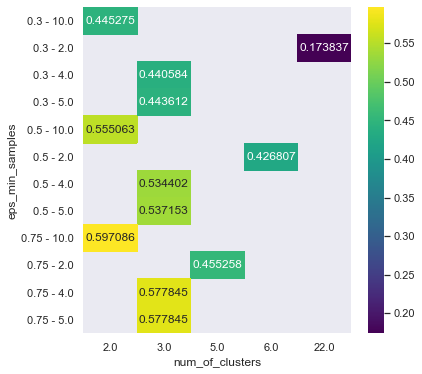

In [68]:
# In the stored dataframe with results, change the data types so that we can display it as a heatmap
dbscan_correlated_result_df['eps'] = dbscan_correlated_result_df['eps'].astype('str')
dbscan_correlated_result_df['min_samples'] = dbscan_correlated_result_df['min_samples'].astype('str')
dbscan_correlated_result_df['eps_min_samples'] = dbscan_correlated_result_df['eps'] + ' - ' + dbscan_correlated_result_df['min_samples']

# Plot the heatmap with Silhouette coefficients for the different values of eps, min samples and number of clusters
dbscan_pivot_df = dbscan_correlated_result_df.pivot(index='eps_min_samples', columns='num_of_clusters', values='silhouette_coefficient')
sns.heatmap(dbscan_pivot_df, annot=True, fmt="g", cmap='viridis')

In [69]:
#save the data from the best model to plot the results
clustering = DBSCAN(eps=0.5, min_samples=2).fit(dbscan_scaled_clustering_df[correlated_features_with_zipcode].drop(columns=['zipcode', 'sale_price']))
score = silhouette_score(dbscan_scaled_clustering_df[correlated_features_with_zipcode].drop(columns=['zipcode','sale_price']), clustering.labels_ )

dbscan_clustering_results_correlated_df = pd.concat([dbscan_clustering_df.reset_index(drop = True), pd.DataFrame(clustering.labels_)], axis=1)

dbscan_clustering_results_correlated_df.rename(columns={0:"Cluster"}, inplace=True)

In [70]:
# Plot the results - the avg sale price by cluster to see if the clusters have different  
fig = px.bar(dbscan_clustering_results_correlated_df[['sale_price','Cluster']].groupby(by=['Cluster']).mean().reset_index(),\
             y="sale_price", x='Cluster', color="Cluster")
fig.show(renderer="colab")

In [71]:
# Looking at the cluster size we see that there is just one main cluster and the remaining clusters have just few points
dbscan_clustering_results_correlated_df.groupby(by=['Cluster']).size()

Cluster
-1       20
 0    24932
 1        2
 2        6
 3        2
 4        2
dtype: int64

#### <font color='red'> 2) With pca components </font>

In [72]:
# Iterate through the different values of eps and min samples to identify when we get the best Silhouette co-efficient
eps_list = [0.3, 0.5, 0.75]
min_samples_list = [4, 5, 10]

dbscan_pca_result_df = pd.DataFrame(columns = ['eps', 'min_samples', 'silhouette_coefficient', 'num_of_clusters'])

for eps in eps_list:
    for min_samples in min_samples_list:
        #print(eps)
        #print(min_samples)
        clustering = DBSCAN(eps=eps, min_samples=min_samples).fit(PCA_components)
        if len(set(clustering.labels_))>1:
            score = silhouette_score(PCA_components, clustering.labels_ )
            dbscan_pca_result_df = dbscan_pca_result_df.append({'eps' : eps, 'min_samples' : min_samples, 'silhouette_coefficient': score, \
                                                        'num_of_clusters' : len(set(clustering.labels_))}, ignore_index=True)

<AxesSubplot:xlabel='num_of_clusters', ylabel='eps_min_samples'>

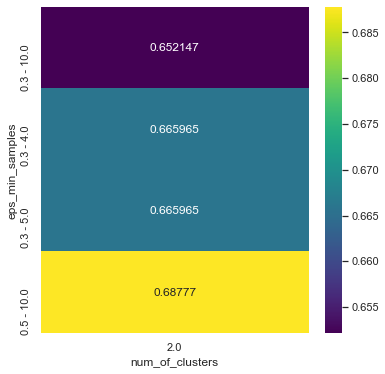

In [73]:
# In the stored dataframe with results, change the data types so that we can display it as a heatmap
dbscan_pca_result_df['eps'] = dbscan_pca_result_df['eps'].astype('str')
dbscan_pca_result_df['min_samples'] = dbscan_pca_result_df['min_samples'].astype('str')
dbscan_pca_result_df['eps_min_samples'] = dbscan_pca_result_df['eps'] + ' - ' + dbscan_pca_result_df['min_samples']

# Plot the heatmap with Silhouette coefficients for the different values of eps, min samples and number of clusters

dbscan_pca_result_pivot_df = dbscan_pca_result_df.pivot(index='eps_min_samples', columns='num_of_clusters', values='silhouette_coefficient')
sns.heatmap(dbscan_pca_result_pivot_df, annot=True, fmt="g", cmap='viridis')

In [74]:
#save the data from the best model to plot the results
dbcan_pca_max_coeff_index = dbscan_pca_result_df['silhouette_coefficient'].idxmax()

dbcan_pca_clustering = DBSCAN(eps=float(dbscan_pca_result_df.iloc[dbcan_pca_max_coeff_index]['eps']), \
                              min_samples=float(dbscan_pca_result_df.iloc[dbcan_pca_max_coeff_index]['min_samples'])).fit(PCA_components)

score = silhouette_score(PCA_components, dbcan_pca_clustering.labels_ )

dbscan_PCA_components_results = PCA_components.copy()
dbscan_PCA_components_results['Cluster'] = clustering.labels_
dbcan_pca_clustering_df = pd.concat([dbscan_clustering_df.reset_index(drop = True), dbscan_PCA_components_results], axis=1)

In [75]:
# Looking at the cluster size we see that there is just one main cluster and the remaining clusters have just few points
# even with pca the results didn't improve
dbcan_pca_clustering_df.groupby(by=['Cluster']).size()

Cluster
0    24964
dtype: int64

#### <font color='red'> 3) With t-sne components </font>

In [79]:
# Using another dimensionality reduction technique t-SNE to see if we are able to improve the Silhouette coefficient 
# Use the cluster number from the above approaches 

DBSCAN_clustering = DBSCAN(eps=0.3, min_samples=20).fit(tsne_results)
dbscan_tsne_labels_clusters = DBSCAN_clustering.labels_

score = silhouette_score(tsne_results, dbscan_tsne_labels_clusters)

print("Silhouette Coefficient:", score)

Silhouette Coefficient: 0.12565623


In [80]:
set(dbscan_tsne_labels_clusters)

{-1, 0, 1, 2, 3, 4, 5}